 ### DA6401 - Assignment 2 
 ##### DA24M006

#### Part A: Training from scratch 

Downloading the iNaturalist Dataset

In [ ]:
# !curl https://storage.googleapis.com/wandb_datasets/nature_12K.zip --output nature_12K.zip
# !unzip nature_12K.zip > /dev/null 2>&1
# !rm nature_12K.zip

I put the dataset in kaggle input folder and finded the train and validated dataset file

In [ ]:
import os
folder_path = r'/kaggle/input/dl-a2-dataset/inaturalist_12K'
split_folder = os.listdir(folder_path)
total_data = 0
data_per_split = []
for folder in split_folder:
    split_folder_path = os.path.join(folder_path, folder)
    subtotal = 0
    for sub_calss in os.listdir(split_folder_path):
        files = os.listdir(os.path.join(split_folder_path, sub_calss))
        total_data += len(files)
        subtotal += len(files)
    data_per_split.append([folder, subtotal])
print(total_data)
print(data_per_split)

11999
[['val', 2000], ['train', 9999]]


Q1.

In [4]:
!pip install wandb

In [ ]:
import wandb
wandb.login()

wandb: WARNING If you're specifying your api key in code, ensure this code is not shared publicly.
wandb: WARNING Consider setting the WANDB_API_KEY environment variable, or running `wandb login` from the command line.
wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc
wandb: Currently logged in as: da24m006 (da24m006-iit-madras) to https://api.wandb.ai. Use `wandb login --relogin` to force relogin


True

Importing Library : Pytorch, PyTorch Lightning, Numpy and wandb  

In [6]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import pytorch_lightning as pl
import numpy as np
from torch.utils.data import DataLoader, random_split
from torchvision import datasets, transforms
import os
import wandb
from pytorch_lightning.loggers import WandbLogger
from pytorch_lightning.callbacks import ModelCheckpoint

#### Q1 Build a Custom  CNN model 

Build a Custom  CNN model Flexible for parameter sweep consisting of  5 convolution layers, dense layer and ouput layer.


In [7]:
# Dictionary of activation functions for flexibility
activation_functions = {
    'relu': nn.ReLU(),
    'gelu': nn.GELU(),
    'silu': nn.SiLU(),
    'mish': nn.Mish(),
}

class CustomCNN(pl.LightningModule):
    def __init__(self, 
                 input_shape=(3, 224, 224),
                 num_classes=10,
                 num_filters=[32, 64, 128, 256, 512],
                 filter_size=3,
                 activation='relu',
                 dense_neurons=512,
                 dropout_rate=0.2,
                 batch_norm=True,
                 data_augment=True,
                 learning_rate=0.001):
        super().__init__()
        self.save_hyperparameters()
        
        # Store parameters
        self.input_shape = input_shape
        self.num_classes = num_classes
        self.num_filters = num_filters
        self.filter_size = filter_size
        self.activation = activation_functions[activation]
        self.dense_neurons = dense_neurons
        self.dropout_rate = dropout_rate
        self.batch_norm =batch_norm
        self.data_augment=data_augment
        self.learning_rate = learning_rate
        
        # Build the network
        self.layers = nn.ModuleList()
        
        # Input channels for the first layer
        in_channels = input_shape[0]
        
        # Create 5 convolutional blocks
        for i in range(5):
            # Convolutional layer
            conv = nn.Conv2d(in_channels, num_filters[i], kernel_size=filter_size, padding=filter_size//2)
            self.layers.append(conv)
            
            # Batch normalization (optional)
            if batch_norm:
                self.layers.append(nn.BatchNorm2d(num_filters[i]))
            
            # Activation function
            self.layers.append(self.activation)
            
            # Max pooling
            self.layers.append(nn.MaxPool2d(2, 2))
            
            # Update input channels for next layer
            in_channels = num_filters[i]
        
        # Calculate size of the flattened feature map
        self.feature_size = self._get_feature_size()
        
        # Dense layer
        self.fc1 = nn.Linear(self.feature_size, dense_neurons)
        self.dropout = nn.Dropout(dropout_rate)
        
        # Output layer
        self.fc2 = nn.Linear(dense_neurons, num_classes)
    
    def _get_feature_size(self):
        # Determine output size after convolutions
        x = torch.zeros(1, *self.input_shape)
        for layer in self.layers:
            x = layer(x)
        return x.view(1, -1).size(1)
    
    def forward(self, x):
        # Pass input through convolutional layers
        for layer in self.layers:
            x = layer(x)
        
        # Flatten the output
        x = x.view(x.size(0), -1)
        
        # Pass through dense layer
        x = self.fc1(x)
        x = self.activation(x)
        x = self.dropout(x)
        
        # Output layer
        x = self.fc2(x)
        
        return x
    
    def training_step(self, batch, batch_idx):
        x, y = batch
        logits = self(x)
        loss = F.cross_entropy(logits, y)
        preds = torch.argmax(logits, dim=1)
        acc = (preds == y).float().mean()
        
        self.log('train_loss', loss, prog_bar=True)
        self.log('train_acc', acc, prog_bar=True)
        return loss
    
    def validation_step(self, batch, batch_idx):
        x, y = batch
        logits = self(x)
        loss = F.cross_entropy(logits, y)
        preds = torch.argmax(logits, dim=1)
        acc = (preds == y).float().mean()
        
        self.log('val_loss', loss, prog_bar=True)
        self.log('val_acc', acc, prog_bar=True)
        return loss
    
    def test_step(self, batch, batch_idx):
        x, y = batch
        logits = self(x)
        loss = F.cross_entropy(logits, y)
        preds = torch.argmax(logits, dim=1)
        acc = (preds == y).float().mean()
        
        self.log('test_loss', loss, prog_bar=True)
        self.log('test_acc', acc, prog_bar=True)
        return loss
    
    def configure_optimizers(self):
        optimizer = torch.optim.Adam(self.parameters(), lr=self.learning_rate)
        return optimizer


#### Q2. Hyperparameter tuning using sweep configiguration 

##### Dataset Preparation (spliting, transform, loading)
###### STEP1: Stratified split to split train dataset into train(80%) and validation(20%)
###### STEP2: Dataset tarnsformed(data augmentation for train dataset) and loadeded using dataloader

In [8]:
import os
import torch
from torchvision import datasets, transforms
from torch.utils.data import DataLoader, Subset
import random
from collections import defaultdict

def stratified_split(dataset, val_split=0.2, seed=42):
    """
    Splits dataset indices into stratified train and validation subsets.
    :param dataset: Torch Dataset object (must have `targets` attribute).
    :param val_split: Fraction of data to use for validation.
    :param seed: Random seed for reproducibility.
    :return: train_indices, val_indices
    """
    targets = dataset.targets
    label_to_indices = defaultdict(list)

    # Group indices by class
    for idx, label in enumerate(targets):
        label_to_indices[label].append(idx)

    train_indices = []
    val_indices = []

    random.seed(seed)

    for label, indices in label_to_indices.items():
        n_total = len(indices)
        n_val = int(n_total * val_split)

        # Shuffle indices for this class
        random.shuffle(indices)

        val_indices.extend(indices[:n_val])
        train_indices.extend(indices[n_val:])

    # Shuffle final lists (optional, especially for training)
    random.shuffle(train_indices)
    random.shuffle(val_indices)

    return train_indices, val_indices



def prepare_inaturalist_data(data_dir, config, val_split=0.2):
    """
    Prepare the iNaturalist dataset with a custom stratified split.
    Augmentations are applied based on config.data_augmentation flag.
    
    Parameters:
    - data_dir: Path to data
    - config: wandb.config (expects config.batch_size, config.image_size, config.data_augmentation)
    - val_split: Fraction of training data used for validation
    """
    image_size = config.image_size
    batch_size = config.batch_size
    
    # Normal Transformation applied on train,valid and test all dataset
    base_transform = transforms.Compose([
        transforms.Resize((image_size, image_size)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406],
                             std=[0.229, 0.224, 0.225])
    ])
    
    # Data Augmentation transformation  will be applied on train dataset
    augment_transform = transforms.Compose([
        transforms.Resize((image_size, image_size)),
        transforms.RandomHorizontalFlip(),
        transforms.RandomRotation(10),
        transforms.ColorJitter(brightness=0.1, contrast=0.1, saturation=0.1, hue=0.1),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    ])

    # Load full train dataset
    full_train_dataset = datasets.ImageFolder(os.path.join(data_dir, 'train'))

    # Perform stratified split on complete train dataset to split in train and valid
    train_indices, val_indices = stratified_split(full_train_dataset, val_split=val_split, seed=42)

    # Create Subsets
    train_dataset = Subset(full_train_dataset, train_indices)
    val_dataset = Subset(full_train_dataset, val_indices)

    # Assign  transforms conditionally
    if config.data_augment:
        train_dataset.dataset.transform = augment_transform
    else:
        train_dataset.dataset.transform = base_transform

    val_dataset.dataset.transform = base_transform

    
    # Train and Validation Dataset Loading
    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=4, pin_memory=True)
    val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=4, pin_memory=True)

    # Load the test dataset
    test_dataset = datasets.ImageFolder(os.path.join(data_dir, 'val'), transform=base_transform)
    test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=4, pin_memory=True)

    # Class info
    num_classes = len(full_train_dataset.classes)
    class_names = full_train_dataset.classes

    return train_loader, val_loader, test_loader, num_classes, class_names

##### Traing the Custom CNN Model with Sweep Configuration (hyperparameter tunning)

##### Bayesian optimization for efficient search and 50 run for a sweep 

In [ ]:
# Define the sweep configuration
sweep_config = {
    'method': 'bayes',  # Bayesian optimization for efficient search
    'metric': {
        'name': 'val_acc',
        'goal': 'maximize'
    },
    'parameters': {
        'image_size': {'value': 224},  # Fixed image size
        'batch_size': {'values': [32, 64]},
        'num_filters': {'values': [
            [32, 32, 32, 32, 32],     # Same in all layers
            [32, 64, 128, 256, 512],  # Doubling in each subsequent layer
            [128, 64, 32, 16, 8],    #  halving in each subsequent layer
            [64, 128, 256, 128, 64]   # Increasing then decreasing
        ]},
        'filter_size': {'value': 3},
        'activation': {'values': ['relu', 'gelu', 'silu', 'mish']},
        'dense_neurons': {'values': [128, 256, 512, 1024]},
        'dropout_rate': {'values': [0.2, 0.3]},
        'batch_norm': {'values': [True, False]},
        'data_augment': {'values': [True, False]},
        'learning_rate': {'values': [0.001, 0.0005, 0.0001]},
        'epochs': {'value': 10}  # Fixed number of epochs
    }
}


def train_model(config=None):
    """
    Train the model with given hyperparameters and log to wandb.
    """
    wandb.init(config=config)
    config = wandb.config

    # Create a descriptive run name based on hyperparameters
    run_name = f"bs_{config.batch_size}_act_{config.activation}_dense_{config.dense_neurons}_drop_{config.dropout_rate}_batchnorm_{config.batch_norm}"
    
    # Set the name in wandb
    wandb.run.name = run_name
    wandb.run.save()  # Save the run name early

    # Prepare data
    train_loader, val_loader, test_loader, num_classes, class_names = prepare_inaturalist_data(
        data_dir='/kaggle/input/dl-a2-dataset/inaturalist_12K',
        config=config
    )
    
    # Create model with current hyperparameters
    model = CustomCNN(
        input_shape=(3, config.image_size, config.image_size),
        num_classes=num_classes,
        num_filters=config.num_filters,
        filter_size=config.filter_size,
        activation=config.activation,
        dense_neurons=config.dense_neurons,
        dropout_rate=config.dropout_rate,
        batch_norm=config.batch_norm,
        data_augment=config.data_augment,
        learning_rate=config.learning_rate
    )
    
    # Set up wandb logger and model checkpoint
    wandb_logger = WandbLogger(log_model=True)
    checkpoint_callback = ModelCheckpoint(
        monitor='val_loss',
        dirpath='./checkpoints/',
        filename='{epoch:02d}-{val_loss:.2f}',
        save_top_k=1,
        mode='min'
    )
    
    # Create trainer
    trainer = pl.Trainer(
        max_epochs=config.epochs,
        accelerator='gpu' if torch.cuda.is_available() else 'cpu',
        logger=wandb_logger,
        callbacks=[checkpoint_callback],
        deterministic=True,  # For reproducibility
        precision="16-mixed"
    )
    
    # Train the model
    trainer.fit(model, train_loader, val_loader)
    
    # Test the model
    trainer.test(model, test_loader)


# Run the sweep
sweep_id = wandb.sweep(sweep_config, project='DL_A2_PARTA_CNN_sweep')
wandb.agent(sweep_id, train_model, count=50)  


Q3. Observation based: Done in report Based on the above plots of Q2 sweep run. 

Q4. Using Best model to get the test accuracy on test dataset and predictions plot(10x3)



Best Run: bs_64_act_mish_dense_512_drop_0.3_batchnorm_True
Validation Accuracy: 40.52%


wandb:   1 of 1 files downloaded.  


Testing: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test_acc          │     0.429500013589859     │
│         test_loss         │     1.673210620880127     │
└───────────────────────────┴───────────────────────────┘

Test Accuracy: 42.95%


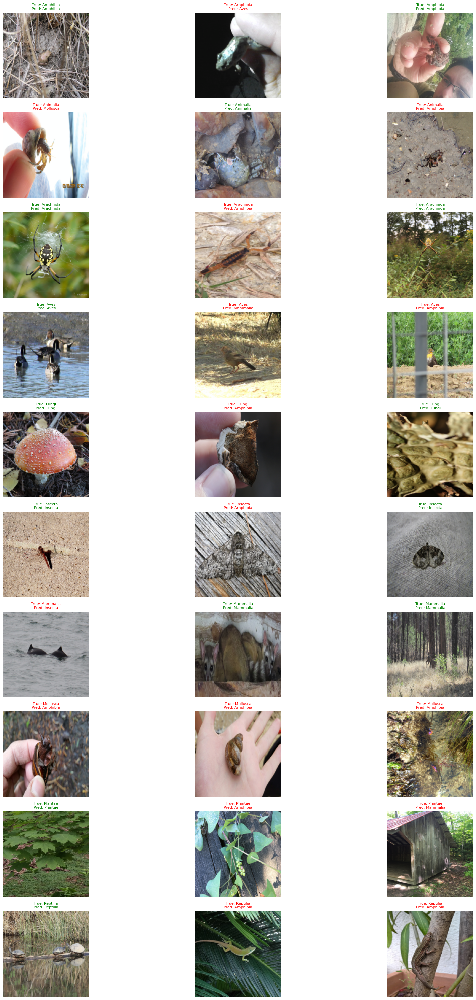

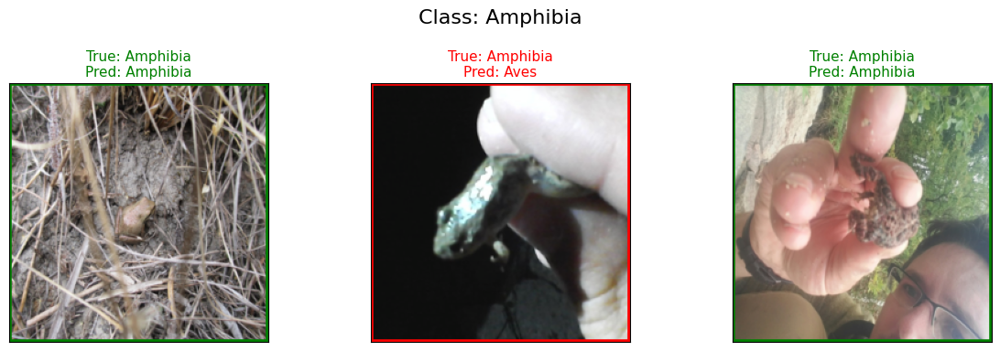

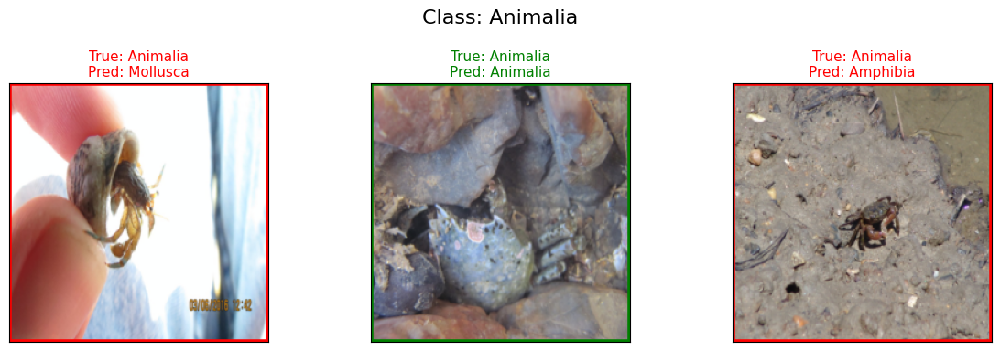

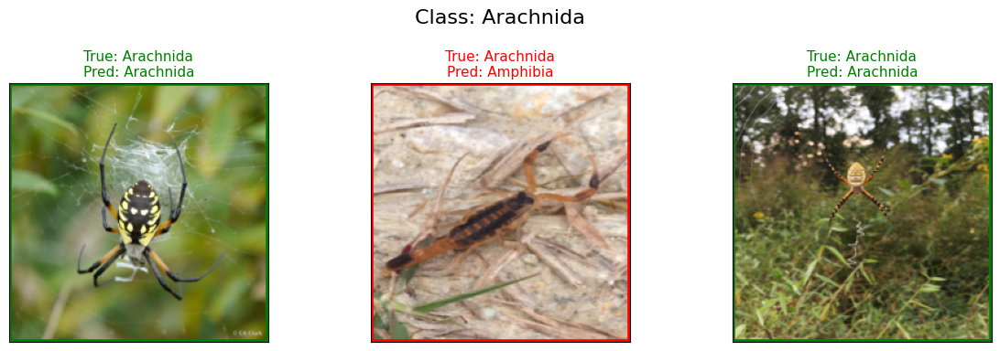

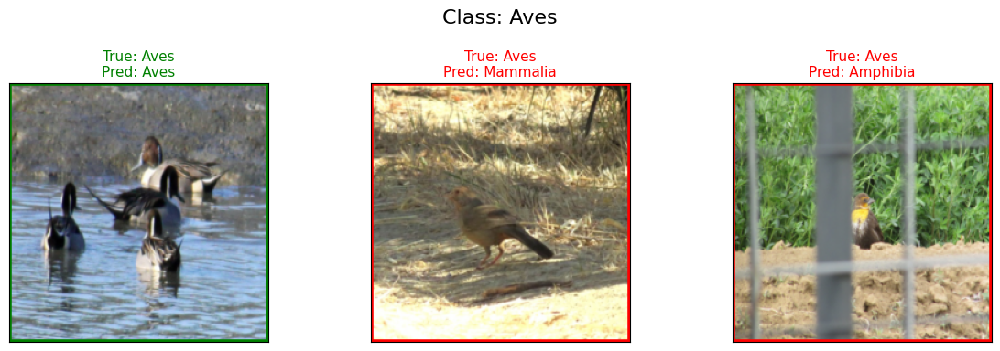

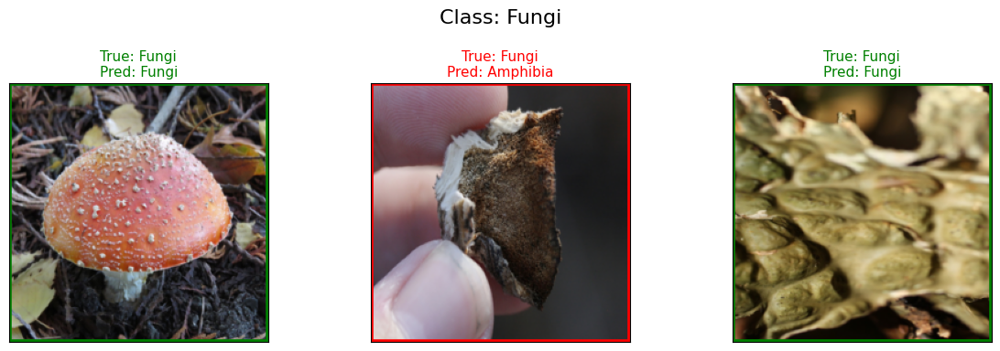

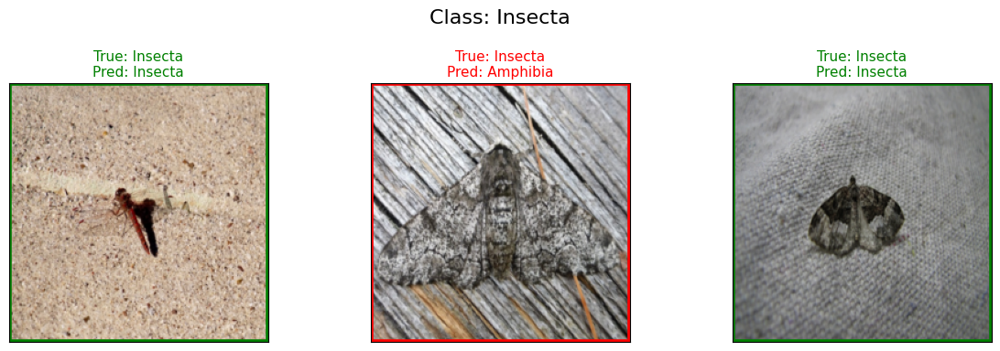

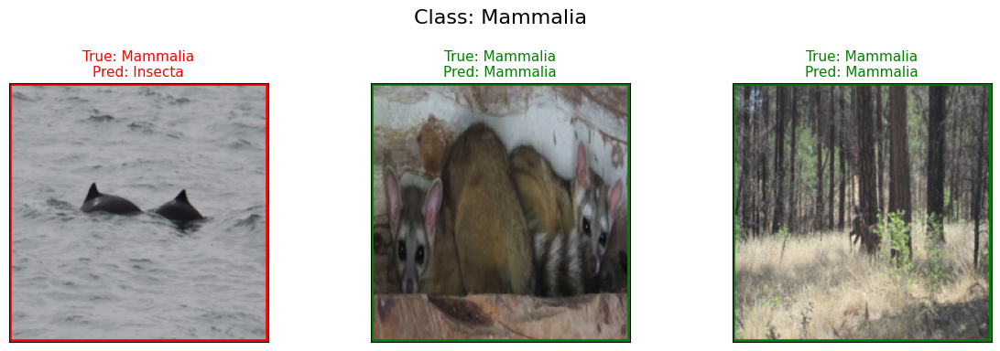

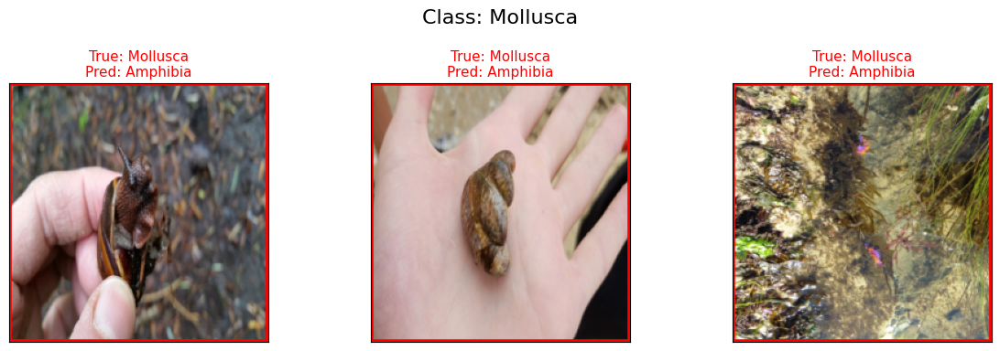

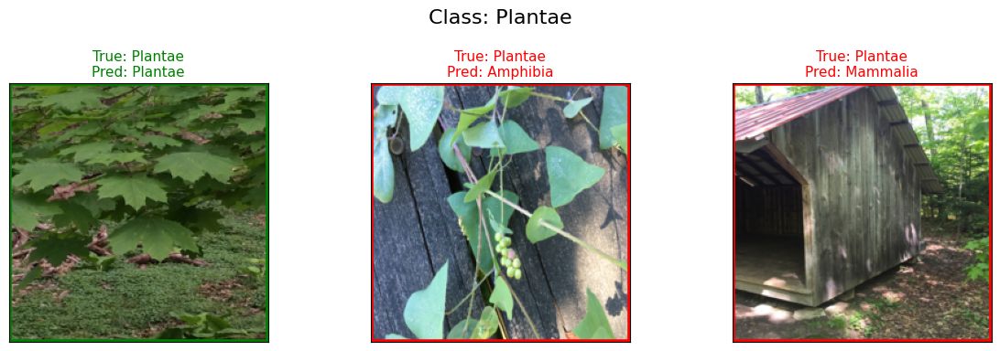

In [ ]:
import torch
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import wandb
import torch
import pytorch_lightning as pl
from pytorch_lightning.loggers import WandbLogger
import matplotlib.pyplot as plt
import numpy as np
from pathlib import Path
from torchvision import transforms, datasets
from torch.utils.data import DataLoader

def get_best_model(entity, project, sweep_id):
    """Retrieve best model from W&B sweep"""
    api = wandb.Api()
    sweep = api.sweep(f"{entity}/{project}/{sweep_id}")
    runs = sorted(sweep.runs, key=lambda run: run.summary.get('val_acc', 0), reverse=True)
    
    if not runs:
        raise ValueError("No runs found in the sweep")
    
    best_run = runs[0]
    print(f"Best Run: {best_run.name}\nValidation Accuracy: {best_run.summary['val_acc']:.2%}")

    # Find and download model artifact
    for artifact in best_run.logged_artifacts():
        if artifact.type == "model":
            artifact_dir = artifact.download()
            for f in Path(artifact_dir).iterdir():
                if f.suffix == ".ckpt":
                    return str(f), dict(best_run.config)
    
    raise FileNotFoundError("No model checkpoint found")

def prepare_test_data(config):
    """Prepare test data loader from specified directory"""
    test_transform = transforms.Compose([
        transforms.Resize((config['image_size'], config['image_size'])),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    ])
    
    test_dataset = datasets.ImageFolder(
        root='/kaggle/input/dl-a2-dataset/inaturalist_12K/val',
        transform=test_transform
    )
    
    return DataLoader(
        test_dataset,
        batch_size=config['batch_size'],
        shuffle=False,
        num_workers=4
    ), test_dataset.classes

def visualize_predictions(model, test_loader, class_names):
    """Generate 10x3 grid of test predictions"""
    model.eval()
    device = next(model.parameters()).device
    
    # Collect 3 samples per class
    samples = {i: [] for i in range(len(class_names))}
    
    with torch.no_grad():
        for images, labels in test_loader:
            images = images.to(device)
            outputs = model(images)
            _, preds = torch.max(outputs, 1)
            
            # Denormalize images
            images = images.cpu().numpy()
            images = images.transpose(0, 2, 3, 1)
            mean = np.array([0.485, 0.456, 0.406])
            std = np.array([0.229, 0.224, 0.225])
            images = std * images + mean
            images = np.clip(images, 0, 1)
            
            for img, true, pred in zip(images, labels, preds.cpu()):
                if len(samples[true.item()]) < 3:
                    samples[true.item()].append((img, true.item(), pred.item()))
                
                if all(len(v) >= 3 for v in samples.values()):
                    break

    # Create plot
    fig, axes = plt.subplots(10, 3, figsize=(20, 30))
    for class_idx in range(10):
        for sample_idx in range(3):
            img, true, pred = samples[class_idx][sample_idx]
            ax = axes[class_idx, sample_idx]
            ax.imshow(img)
            ax.axis('off')
            
            true_name = class_names[true]
            pred_name = class_names[pred]
            color = 'green' if true == pred else 'red'
            ax.set_title(f"True: {true_name}\nPred: {pred_name}", color=color, fontsize=8)
    
    plt.tight_layout()
    return fig

def evaluate_model(checkpoint_path, config):
    """Evaluate model on test set and log results"""
    # Initialize W&B
    wandb.init(project="DL_A2_PARTA_Q4", entity="da24m006-iit-madras")
    wandb.run.name="Q4_test_acc_predict_grid_plot"
    wandb.run.save()
    # Load model
    model = CustomCNN.load_from_checkpoint(
        checkpoint_path,
        input_shape=(3, config['image_size'], config['image_size']),
        num_classes=10
    )
    
    # Prepare test data
    test_loader, class_names = prepare_test_data(config)
    
    # Evaluate
    trainer = pl.Trainer(
        accelerator='auto',
        logger=False,
        enable_checkpointing=False
    )
    
    # Test accuracy
    test_results = trainer.test(model, test_loader)
    test_acc = test_results[0]['test_acc']
    print(f"Test Accuracy: {test_acc:.2%}")
    
    # Generate predictions grid
    fig = visualize_predictions(model, test_loader, class_names)


    figures = visualize_predictions_per_class(model, test_loader, class_names)

    for class_name, fig in figures:
        wandb.log({f"Predictions/{class_name}": wandb.Image(fig)})

    plt.close()

if __name__ == "__main__":
    # Configuration
    ENTITY = "da24m006-iit-madras"
    PROJECT = "DL_A2_PARTA_CNN_sweep"
    SWEEP_ID = "cfxm050a"  # Replace with your actual sweep ID
    
    # Get best model
    checkpoint_path, config = get_best_model(ENTITY, PROJECT, SWEEP_ID)
    
    # Evaluate and visualize
    evaluate_model(checkpoint_path, config)
    wandb.finish()
